In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import pandas as pd 
import numpy as np
import random 
import plotly.express as px 
np.random.seed(42)
sns.set(font_scale=1.3)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score

In [ ]:
data = pd.read_csv('/content/heart_disease.csv', error_bad_lines=False)

<ipython-input-2-0d6e093cac9f>:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  data = pd.read_csv('/content/heart_disease.csv', error_bad_lines=False)


In [ ]:
data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           4238 non-null   object 
 1   age              4238 non-null   int64  
 2   education        4133 non-null   object 
 3   currentSmoker    4238 non-null   int64  
 4   cigsPerDay       4209 non-null   float64
 5   BPMeds           4185 non-null   float64
 6   prevalentStroke  4238 non-null   object 
 7   prevalentHyp     4238 non-null   int64  
 8   diabetes         4238 non-null   int64  
 9   totChol          4188 non-null   float64
 10  sysBP            4238 non-null   float64
 11  diaBP            4238 non-null   float64
 12  BMI              4219 non-null   float64
 13  heartRate        4237 non-null   float64
 14  glucose          3850 non-null   float64
 15  Heart_ stroke    4238 non-null   object 
dtypes: float64(8), int64(4), object(4)
memory usage: 1.4 MB


In [ ]:
dataCopy = data.copy()

In [ ]:
dataCopy['Gender'].value_counts()

Female    2419
Male      1819
Name: Gender, dtype: int64

In [ ]:
dataCopy['Gender'].replace(to_replace=['Female'],value=1,inplace=True)
dataCopy['Gender'].replace(to_replace=['Male'],value=0,inplace=True)
dataCopy['Gender']=dataCopy['Gender'].astype(int)

In [ ]:
dataCopy['education'].dropna(inplace=True)

In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
dataCopy['education']= label_encoder.fit_transform(dataCopy['education']).astype(int)

In [ ]:
dataCopy['currentSmoker'].value_counts()

0    2144
1    2094
Name: currentSmoker, dtype: int64

0    2144
1    2094
Name: currentSmoker, dtype: int64


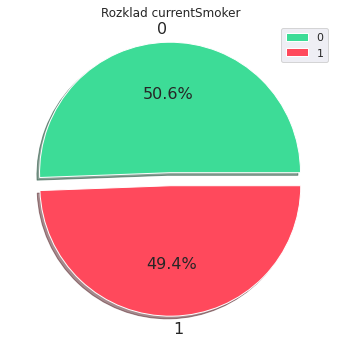

In [ ]:
plt.figure(figsize=[8,6])
sns.set() #ustawmy sobie styl z biblio seaborn
dataCopy.currentSmoker.value_counts().plot(kind='pie',fontsize=16,colors=['#3DDC97','#FF495C'],
                             explode=[0.1,0],shadow=True,
                             autopct='%1.1f%%')

#wyswietlenie legendy na wykresie
plt.legend()
#pozbycie sie labela z boku 'Alive_at_1'
plt.ylabel('')
plt.title('Rozklad currentSmoker')
print(dataCopy.currentSmoker.value_counts())

In [ ]:
dataCopy['cigsPerDay'].isna().sum()

29

In [ ]:
to_mean = dataCopy.loc[dataCopy['currentSmoker'] == 1]
mean = to_mean['cigsPerDay'].mean()
mean
dataCopy['cigsPerDay'] = dataCopy['cigsPerDay'].fillna(mean)

In [ ]:
dataCopy['BPMeds'].isna().sum()

53

In [ ]:
#skoro dominuja wartosci 0 , to zastapmy braki najczesciej wystepujaca wartoscia
dataCopy['BPMeds'].value_counts()

0.0    4061
1.0     124
Name: BPMeds, dtype: int64

In [ ]:
dataCopy['BPMeds']=dataCopy['BPMeds'].fillna(0)

In [ ]:
dataCopy['BPMeds']=dataCopy['BPMeds'].astype(int)

In [ ]:
dataCopy['prevalentStroke'].replace(to_replace=['yes'],value=1,inplace=True)
dataCopy['prevalentStroke'].replace(to_replace=['no'],value=0,inplace=True)
dataCopy['prevalentStroke']=dataCopy['prevalentStroke'].astype(int)

In [ ]:

dataCopy['prevalentHyp'].value_counts()
dataCopy['prevalentHyp']=dataCopy['prevalentHyp'].astype(int)

In [ ]:
dataCopy['totChol'].isna().sum()

50

In [ ]:
print(dataCopy.corr())

                   Gender       age  education  currentSmoker  cigsPerDay  \
Gender           1.000000  0.028979  -0.052302      -0.197596   -0.316723   
age              0.028979  1.000000   0.149417      -0.213748   -0.192113   
education       -0.052302  0.149417   1.000000      -0.008398    0.004280   
currentSmoker   -0.197596 -0.213748  -0.008398       1.000000    0.770799   
cigsPerDay      -0.316723 -0.192113   0.004280       0.770799    1.000000   
BPMeds           0.051545  0.120955   0.011917      -0.048358   -0.046500   
prevalentStroke  0.004546  0.057655   0.023319      -0.032988   -0.033052   
prevalentHyp    -0.005313  0.307194   0.077647      -0.103260   -0.066612   
diabetes        -0.015708  0.101258   0.035611      -0.044295   -0.037859   
totChol          0.070322  0.262131   0.018115      -0.046562   -0.025275   
sysBP            0.035989  0.394302   0.114069      -0.130230   -0.088275   
diaBP           -0.057933  0.206104   0.066939      -0.107746   -0.055851   

totChol jest najbardziej skorelowane dodatnio z: 

* age,

* sysBP (sysBP: skurczowe ciśnienie krwi (mmHg) od 120-129,max do 140 norma)


prawidłowa wartość cholesterolu znajduje się poniżej 200, a nieprawidłowa powyzej 200 do ok. 240

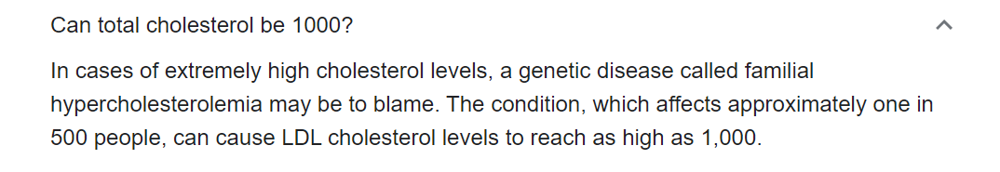


In [ ]:
tochol_mean1 = dataCopy.loc[dataCopy['totChol']> 250]['totChol'].mean()
tochol_mean2 = dataCopy.loc[dataCopy['totChol']< 250]['totChol'].mean()
for i in range(len(dataCopy)):
  if [(dataCopy['age']> 50)&(dataCopy['sysBP']>140)]:
    dataCopy['totChol'] = dataCopy['totChol'].fillna(tochol_mean1)
    
  else:
    dataCopy['totChol'] = dataCopy['totChol'].fillna(tochol_mean2)
#wiek powyzej 50, a sysBP powyzej 140

In [ ]:
len(dataCopy[dataCopy['BMI'].isna()])

19

In [ ]:
dataCopy.sort_values(['prevalentHyp','diaBP' ,'sysBP', 'BMI'], ascending=False,inplace=True)

In [ ]:
dataCopy['BMI'] = dataCopy['BMI'].fillna(method='bfill')

In [ ]:
dataCopy['heartRate'].dropna(inplace=True)

In [ ]:
dataCopy['Heart_ stroke'].replace(to_replace=['yes'],value=1,inplace=True)
dataCopy['Heart_ stroke'].replace(to_replace=['No'],value=0,inplace=True)
dataCopy['Heart_ stroke']=dataCopy['Heart_ stroke'].astype(int)

In [ ]:
dataCopy.sort_values(['diabetes','glucose'], ascending=False,inplace=True)
dataCopy['glucose'] = dataCopy['glucose'].fillna(method='ffill')

In [ ]:
dataCopy.rename(columns = {'Heart_ stroke':'Heart_stroke'}, inplace = True)

In [ ]:
dataCopy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4238 entries, 2909 to 1924
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           4238 non-null   int64  
 1   age              4238 non-null   int64  
 2   education        4238 non-null   int64  
 3   currentSmoker    4238 non-null   int64  
 4   cigsPerDay       4238 non-null   float64
 5   BPMeds           4238 non-null   int64  
 6   prevalentStroke  4238 non-null   int64  
 7   prevalentHyp     4238 non-null   int64  
 8   diabetes         4238 non-null   int64  
 9   totChol          4238 non-null   float64
 10  sysBP            4238 non-null   float64
 11  diaBP            4238 non-null   float64
 12  BMI              4238 non-null   float64
 13  heartRate        4237 non-null   float64
 14  glucose          4238 non-null   float64
 15  Heart_stroke     4238 non-null   int64  
dtypes: float64(7), int64(9)
memory usage: 562.9 KB


0    3594
1     644
Name: Heart_stroke, dtype: int64


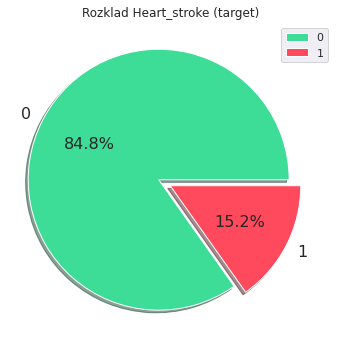

In [ ]:
plt.figure(figsize=[8,6])
sns.set() #ustawmy sobie styl z biblio seaborn
dataCopy.Heart_stroke.value_counts().plot(kind='pie',fontsize=16,colors=['#3DDC97','#FF495C'],
                             explode=[0.1,0],shadow=True,
                             autopct='%1.1f%%')

#wyswietlenie legendy na wykresie
plt.legend()
#pozbycie sie labela z boku 'Alive_at_1'
plt.ylabel('')
plt.title('Rozklad Heart_stroke (target)')
print(dataCopy.Heart_stroke.value_counts())

In [ ]:
dataCopy.dropna(inplace=True)

In [ ]:
#usuniecie danych odstajacych 
cols = ['age','cigsPerDay','totChol','sysBP','BMI','heartRate','glucose'] # one or more

Q1 = dataCopy[cols].quantile(0.25)
Q3 = dataCopy[cols].quantile(0.75)
IQR = Q3 - Q1

dataCopy = dataCopy[~((dataCopy[cols] < (Q1 - 1.5 * IQR)) |(dataCopy[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [ ]:
# from sklearn.preprocessing import StandardScaler

# scaler=StandardScaler()

# dataCopy[['age','cigsPerDay','totChol','sysBP','BMI','heartRate','glucose']]=scaler.fit_transform(dataCopy[['age','cigsPerDay','totChol','sysBP','BMI','heartRate','glucose']])
# dataCopy.head()

In [ ]:
target=dataCopy.pop('Heart_stroke')
data = dataCopy

In [ ]:
data.head()

,Gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
451,1,50,2,1,8.0,0,0,0,1,292.0,132.0,82.0,22.54,80.0,110.0
3839,0,63,3,0,0.0,0,0,1,1,260.0,155.5,98.0,30.08,67.0,109.0
2849,0,48,2,1,20.0,0,0,0,1,172.0,131.0,79.0,35.12,75.0,108.0
3797,0,53,2,0,0.0,0,0,0,1,234.0,113.0,68.0,24.80,76.0,108.0
3739,1,65,3,0,0.0,0,0,1,1,193.0,153.0,100.0,32.00,75.0,107.0


In [ ]:
data.iloc[[12]]

,Gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
1123,0,64,1,0,0.0,0,0,0,1,251.0,133.0,72.5,24.28,65.0,86.0


In [ ]:
# data.head()
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=42)

# print(f'X_train shape {X_train.shape}')
# print(f'y_train shape {y_train.shape}')
# print(f'X_test shape {X_test.shape}')
# print(f'y_test shape {y_test.shape}')
# print(f'\nTest ratio: {len(X_test) / len(data):.2f}')
# print(f'\ny_train:\n{y_train.value_counts()}')
# print(f'\ny_test:\n{y_test.value_counts()}')

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=42)

print(f'X_train shape {X_train.shape}')
print(f'y_train shape {y_train.shape}')
print(f'X_test shape {X_test.shape}')
print(f'y_test shape {y_test.shape}')
print(f'\nTest ratio: {len(X_test) / len(data):.2f}')
print(f'\ny_train:\n{y_train.value_counts()}')
print(f'\ny_test:\n{y_test.value_counts()}')


X_train shape (2725, 15)
y_train shape (2725,)
X_test shape (682, 15)
y_test shape (682,)

Test ratio: 0.20

y_train:
0    2338
1     387
Name: Heart_stroke, dtype: int64

y_test:
0    600
1     82
Name: Heart_stroke, dtype: int64


In [ ]:
XGB = XGBClassifier(max_depth = 5)
XGB.fit(X_train, y_train)
preds = XGB.predict(X_test)
acc_xgb = (preds == y_test).sum().astype(float) / len(preds)*100

print(f"F1 Score {f1_score(y_test, preds, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, preds)}")

F1 Score 0.5477453580901857
Accuracy 0.8592375366568915


In [ ]:
# Dopasowanie modelu 
# rf = RandomForestClassifier()
# rf.fit(X_train, y_train)
# y_pred = rf.predict(X_test)
# print(f"F1 Score {f1_score(y_test, y_pred, average='macro')}")
# print(f"Accuracy {accuracy_score(y_test, y_pred)}")

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap
explainer = shap.TreeExplainer(XGB)

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

KeyboardInterrupt: ignored

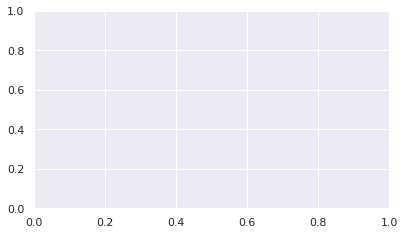

In [ ]:
fig = plt.figure(figsize = (14, 8))
# title = fig.suptitle(" ", fontsize=14)

ax1 = fig.add_subplot(2, 2, 1)
PartialDependenceDisplay.from_estimator(XGB, data, ['BMI'], ax=ax1)
ax1.set_title(" ");

ax2 = fig.add_subplot(2, 2, 2)
PartialDependenceDisplay.from_estimator(XGB, data, ['glucose'], ax=ax2)
ax2.set_title(" ");

ax3 = fig.add_subplot(2, 2, 3)
PartialDependenceDisplay.from_estimator(XGB, data, ['totChol'], ax=ax3)
ax3.set_title(" ");

ax4 = fig.add_subplot(2,2, 4)
PartialDependenceDisplay.from_estimator(XGB, data, ['sysBP'], ax=ax4)
ax4.set_title(" ");

# features = ['BMI', 'glucose', 'cigsPerDay']
# PartialDependenceDisplay.from_estimator(XGB, data, features)

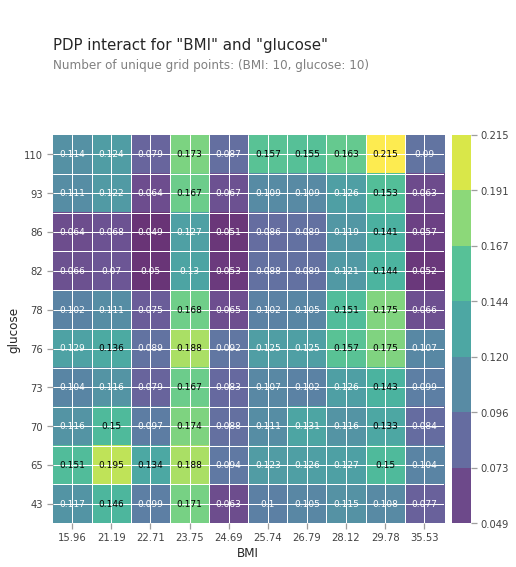

In [ ]:
from pdpbox import pdp, get_dataset, info_plots
features_to_plot = ['BMI', 'glucose']

pdp2d  =  pdp.pdp_interact(model = XGB, dataset = data, model_features = data.columns, features = features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out = pdp2d, feature_names = features_to_plot, plot_type = 'grid')
plt.show()

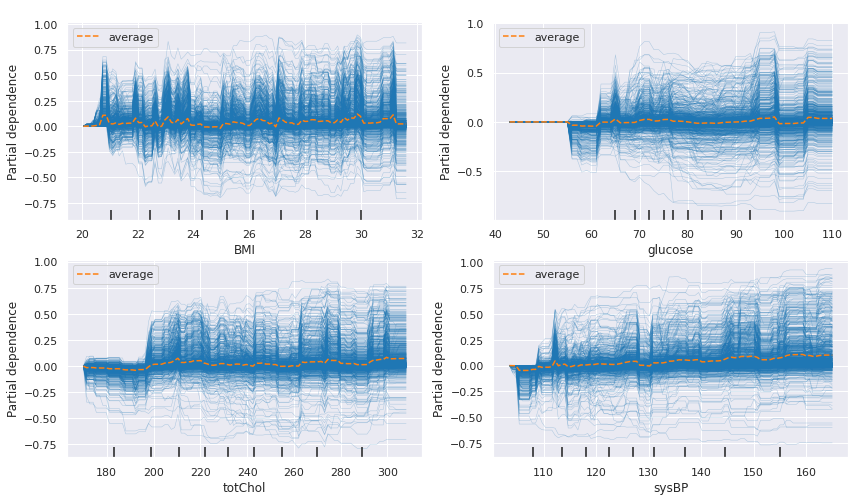

In [ ]:
fig = plt.figure(figsize = (14, 8))
# title = fig.suptitle(" ", fontsize=14)

ax1 = fig.add_subplot(2, 2, 1)
PartialDependenceDisplay.from_estimator(XGB, data, ['BMI'], kind = 'both', centered=True, ax=ax1)
ax1.set_title(" ");

ax2 = fig.add_subplot(2, 2, 2)
PartialDependenceDisplay.from_estimator(XGB, data, ['glucose'], kind = 'both', centered=True, ax=ax2)
ax2.set_title(" ");

ax3 = fig.add_subplot(2, 2, 3)
PartialDependenceDisplay.from_estimator(XGB, data, ['totChol'], kind = 'both', centered=True, ax=ax3)
ax3.set_title(" ");

ax4 = fig.add_subplot(2,2, 4)
PartialDependenceDisplay.from_estimator(XGB, data, ['sysBP'], kind = 'both', centered=True, ax=ax4)
ax4.set_title(" ");

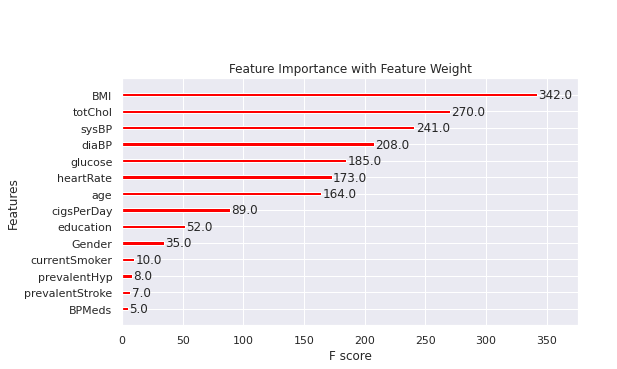

In [ ]:
# ploting XGBoost default feature importances
from xgboost import XGBClassifier, plot_importance

fig = plt.figure(figsize = (18, 10))
title = fig.suptitle(" ", fontsize=14)

ax1 = fig.add_subplot(2, 2, 1)
plot_importance(XGB, importance_type='weight', ax=ax1, color='red')
ax1.set_title("Feature Importance with Feature Weight");

In [ ]:
X_sampled.iloc[12]

Gender               0.00
age                 43.00
education            3.00
currentSmoker        0.00
cigsPerDay           0.00
BPMeds               0.00
prevalentStroke      0.00
prevalentHyp         0.00
diabetes             0.00
totChol            245.00
sysBP              105.00
diaBP               59.50
BMI                 30.55
heartRate           85.00
glucose             77.00
Name: 535, dtype: float64

In [ ]:
# Calculate Shap values
#1
choosen_instance = X_test.loc[[12]]
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
# shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

shap.initjs()
X_sampled = X_train.sample(100, random_state=10)
explainer = shap.TreeExplainer(XGB)
shap_values = explainer.shap_values(X_sampled)
shap.force_plot(explainer.expected_value, shap_values[12], choosen_instance)#X_sampled.iloc[12])

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


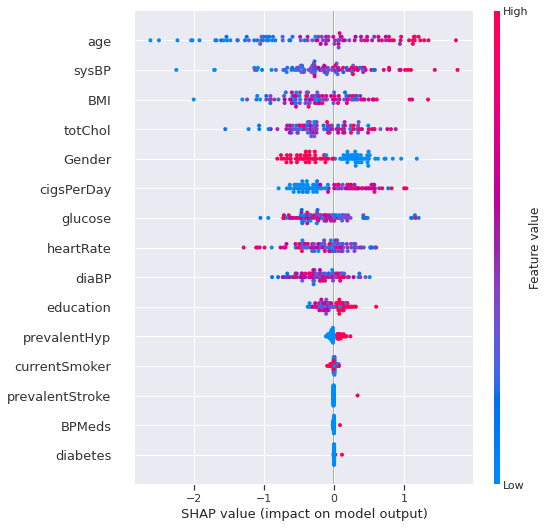

In [ ]:
shap.summary_plot(shap_values, X_sampled)

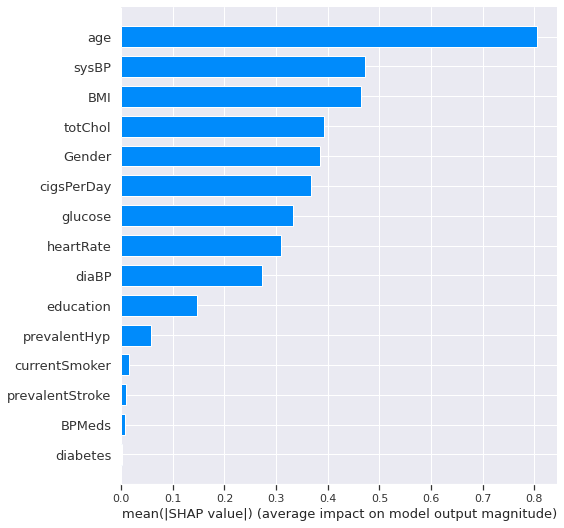

In [ ]:
shap.summary_plot(shap_values, X_sampled, plot_type="bar")

In [ ]:
#2
shap.initjs()
choosen_instance = X_test.loc[[15]]
shap_values = explainer.shap_values(choosen_instance)
# shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

X_sampled = X_train.sample(100, random_state=10)
explainer = shap.TreeExplainer(XGB)
shap_values = explainer.shap_values(X_sampled)
shap.force_plot(explainer.expected_value, shap_values[15], choosen_instance)

In [ ]:
#3
shap.initjs()
choosen_instance = X_test.loc[[62]]
shap_values = explainer.shap_values(choosen_instance)
# shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

X_sampled = X_train.sample(100, random_state=10)
explainer = shap.TreeExplainer(XGB)
shap_values = explainer.shap_values(X_sampled)
shap.force_plot(explainer.expected_value, shap_values[62], choosen_instance)

In [ ]:
#4
shap.initjs()
choosen_instance = X_test.loc[[99]]
shap_values = explainer.shap_values(choosen_instance)
# shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

X_sampled = X_train.sample(100, random_state=10)
explainer = shap.TreeExplainer(XGB)
shap_values = explainer.shap_values(X_sampled)
shap.force_plot(explainer.expected_value, shap_values[99], choosen_instance)

In [ ]:
#5
shap.initjs()
choosen_instance = X_test.loc[[24]]
shap_values = explainer.shap_values(choosen_instance)
# shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

X_sampled = X_train.sample(100, random_state=10)
explainer = shap.TreeExplainer(XGB)
shap_values = explainer.shap_values(X_sampled)
shap.force_plot(explainer.expected_value, shap_values[24], choosen_instance)

In [ ]:
# explainer = shap.TreeExplainer(rf)
# shap_values = explainer(X_test)

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime
import lime.lime_tabular

In [ ]:
predict_fn_xgb = lambda x: XGB.predict_proba(x).astype(float)
X = X_train.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = X_train.columns,class_names=['NO STROKE','STROKE'],kernel_width=5)

In [ ]:
choosen_instance = X_test.loc[[12]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_xgb,num_features=10)
exp.show_in_notebook(show_all=False)

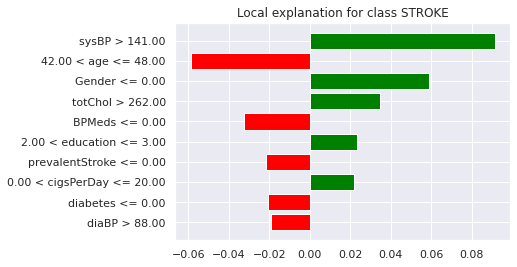

In [ ]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [ ]:
choosen_instance = X_test.loc[[15]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_xgb,num_features=10)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = X_test.loc[[62]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_xgb,num_features=10)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = X_test.loc[[99]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_xgb,num_features=10)
exp.show_in_notebook(show_all=False)

In [ ]:
choosen_instance = X_test.loc[[24]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_xgb,num_features=10)
exp.show_in_notebook(show_all=False)

## Glassbox

In [ ]:
pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 89.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.0/758.0 KB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 KB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 93.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 98.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 92.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 40.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.1/246.1 KB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 74.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 KB

In [ ]:
import interpret
from interpret import show
from interpret.glassbox import ExplainableBoostingClassifier

In [ ]:
ebm = ExplainableBoostingClassifier()
ebm.fit(X_train,y_train)

ExplainableBoostingClassifier()

In [ ]:
ebm.score(X_test,y_test)

0.8797653958944281

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       600
           1       0.29      0.12      0.17        82

    accuracy                           0.86       682
   macro avg       0.59      0.54      0.55       682
weighted avg       0.82      0.86      0.83       682



In [ ]:
ex1 = X_test.iloc[13]


In [ ]:
print(ebm.predict([ex1]))
print(ebm.predict_proba([ex1]))

[0]
[[0.93153593 0.06846407]]


In [ ]:
dir(interpret)

['NullHandler',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'api',
 'getLogger',
 'get_show_addr',
 'get_visualize_provider',
 'glassbox',
 'init_show_server',
 'preserve',
 'provider',
 'set_show_addr',
 'set_visualize_provider',
 'show',
 'show_link',
 'shutdown_show_server',
 'status_show_server',
 'utils',
 'version',
 'visual']

### Global

In [ ]:
ebm_global = ebm.explain_global()

In [ ]:
show(ebm_global)

### Local

In [ ]:
ebm_local = ebm.explain_local(X_test,y_test)

In [ ]:
show(ebm_local)